In [2]:
import IMU_Reader
import pandas as pd
import seaborn as sns

In [ ]:
IMU_Reader.read_IMU_to_file('202510121523_imu.csv', 'test.csv')

Reading Data... (0/240684)
Reading Data... (1000/240684)
Reading Data... (2000/240684)
Reading Data... (3000/240684)
Reading Data... (4000/240684)
Reading Data... (5000/240684)
Reading Data... (6000/240684)
Reading Data... (7000/240684)
Reading Data... (8000/240684)
Reading Data... (9000/240684)
Reading Data... (10000/240684)
Reading Data... (11000/240684)
Reading Data... (12000/240684)
Reading Data... (13000/240684)
Reading Data... (14000/240684)
Reading Data... (15000/240684)
Reading Data... (16000/240684)
Reading Data... (17000/240684)
Reading Data... (18000/240684)
Reading Data... (19000/240684)
Reading Data... (20000/240684)
Reading Data... (21000/240684)
Reading Data... (22000/240684)
Reading Data... (23000/240684)
Reading Data... (24000/240684)
Reading Data... (25000/240684)
Reading Data... (26000/240684)
Reading Data... (27000/240684)
Reading Data... (28000/240684)
Reading Data... (29000/240684)
Reading Data... (30000/240684)
Reading Data... (31000/240684)
Reading Data... (3200

In [ ]:
df = pd.read_csv('test.csv')

C:\Users\bodes\AppData\Local\Temp\ipykernel_2212\734260529.py:2: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  df.date = pd.to_datetime(df['time'])


In [26]:
df['time'] = pd.to_datetime(df['time'])
df['time'].dtype

datetime64[ns, UTC]

In [90]:
df.columns

Index(['Unnamed: 0', 'class', 'device', 'time', 'acc_x', 'acc_y', 'acc_z',
       'gyro_x', 'gyro_y', 'gyro_z', 'mag_x', 'mag_y', 'mag_z', 'temp',
       'pitch', 'pitch_st', 'roll', 'roll_st', 'yaw', 'yaw_st', 'heading',
       'acc_len', 'mag_len', 'mag_st'],
      dtype='object')

In [16]:
df.head()

,Unnamed: 0,class,device,time,acc_x,acc_y,acc_z,gyro_x,gyro_y,gyro_z,...,pitch_st,roll,roll_st,yaw,yaw_st,heading,acc_len,mag_len,mag_st,date
0,0,ATT,LSM9DS1,2025-10-12T15:23:03.961873Z,2.297110,-1.572084,9.408578,-3.99,-3.08,-0.56,...,N,-71.406420,N,-70.444259,N,286.942082,9.811703,1783.488015,N,2025-10-12 15:23:03.961873+00:00
1,1,ATT,LSM9DS1,2025-10-12T15:23:03.977190Z,2.299503,-1.612762,9.430114,-3.92,-2.87,-0.63,...,N,-69.968717,N,-68.005801,N,287.951429,9.839500,1774.431317,N,2025-10-12 15:23:03.977190+00:00
2,2,ATT,LSM9DS1,2025-10-12T15:23:03.997202Z,2.289931,-1.600798,9.461221,-3.92,-2.94,-0.49,...,N,-68.558041,N,-65.614865,N,287.870874,9.865142,1753.485529,N,2025-10-12 15:23:03.997202+00:00
3,3,ATT,LSM9DS1,2025-10-12T15:23:04.017324Z,2.285146,-1.576870,9.434900,-3.78,-2.94,-0.56,...,N,-67.175749,N,-63.280088,N,287.563296,9.834924,1776.736193,N,2025-10-12 15:23:04.017324+00:00
4,4,ATT,LSM9DS1,2025-10-12T15:23:04.037481Z,2.280360,-1.593620,9.442078,-4.06,-2.87,-0.84,...,N,-65.818971,N,-60.990724,N,288.197208,9.843399,1777.872746,N,2025-10-12 15:23:04.037481+00:00


In [24]:
df['time'].dtype

dtype('O')

In [85]:
#Isolating test segments from October 12, 2025

# Test run 1, pushed. 10:28-29
baseline1start = pd.to_datetime(pd.Timestamp('2025-10-12T15:28:40Z'))
baseline1end = pd.to_datetime(pd.Timestamp('2025-10-12T15:29:43Z'))

baseline1segment = df[(df['time'] > baseline1start) & (df['time'] < baseline1end)]

# Test run 2, pushed. 10:39-40
baseline2start = pd.Timestamp('2025-10-12T15:39:30Z')
baseline2end = pd.Timestamp('2025-10-12T15:40:47Z')

baseline2segment = df[(df['time'] > baseline2start) & (df['time'] < baseline2end)]

# Bump test 1, pushed. 10:42-43. One bump
bump1start = pd.Timestamp('2025-10-12T15:42:18Z')
bump1end = pd.Timestamp('2025-10-12T15:43:05Z')

bump1segment = df[(df['time'] > bump1start) & (df['time'] < bump1end)]

# 2 Bumps test 1. 10:44-45. Two bumps, not staggered.
doublebump1start = pd.Timestamp('2025-10-12T15:44:30Z')
doublebump1end = pd.Timestamp('2025-10-12T15:45:35Z')

doublebump1segment = df[(df['time'] > doublebump1start) & (df['time'] < doublebump1end)]

# 1 Small bump, 1 large bump. Ended @ 47
smalllarge1start = pd.Timestamp('2025-10-12T15:46:40Z')
smalllarge1end = pd.Timestamp('2025-10-12T15:47:25Z')

smalllarge1segment = df[(df['time'] > smalllarge1start) & (df['time'] < smalllarge1end)]

# 1 Small bump, 1 large bump. Ended @ 49
smalllarge2start = pd.Timestamp('2025-10-12T15:48:25Z')
smalllarge2end = pd.Timestamp('2025-10-12T15:49:08Z')

smalllarge2segment = df[(df['time'] > smalllarge2start) & (df['time'] < smalllarge2end)]

C:\Users\bodes\AppData\Local\Temp\ipykernel_2212\772136595.py:2: UserWarning: FixedFormatter should only be used together with FixedLocator
  plot.set_xticklabels(plot.get_xticklabels(), rotation=45)


[Text(20373.644907407408, 0, '15:28:40'),
 Text(20373.645023148147, 0, '15:28:50'),
 Text(20373.64513888889, 0, '15:29:00'),
 Text(20373.64525462963, 0, '15:29:10'),
 Text(20373.64537037037, 0, '15:29:20'),
 Text(20373.645486111112, 0, '15:29:30'),
 Text(20373.64560185185, 0, '15:29:40')]

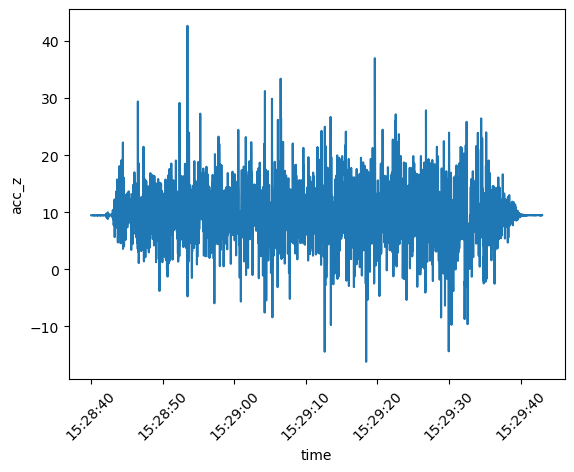

In [54]:
plot = sns.lineplot(data=baseline1segment, x='time', y='acc_z')
plot.set_xticklabels(plot.get_xticklabels(), rotation=45)

C:\Users\bodes\AppData\Local\Temp\ipykernel_2212\2196215016.py:2: UserWarning: FixedFormatter should only be used together with FixedLocator
  plot.set_xticklabels(plot.get_xticklabels(), rotation=45)


[Text(20373.652430555554, 0, '15:39:30'),
 Text(20373.652546296296, 0, '15:39:40'),
 Text(20373.65266203704, 0, '15:39:50'),
 Text(20373.652777777777, 0, '15:40:00'),
 Text(20373.65289351852, 0, '15:40:10'),
 Text(20373.65300925926, 0, '15:40:20'),
 Text(20373.653125, 0, '15:40:30'),
 Text(20373.65324074074, 0, '15:40:40'),
 Text(20373.65335648148, 0, '15:40:50')]

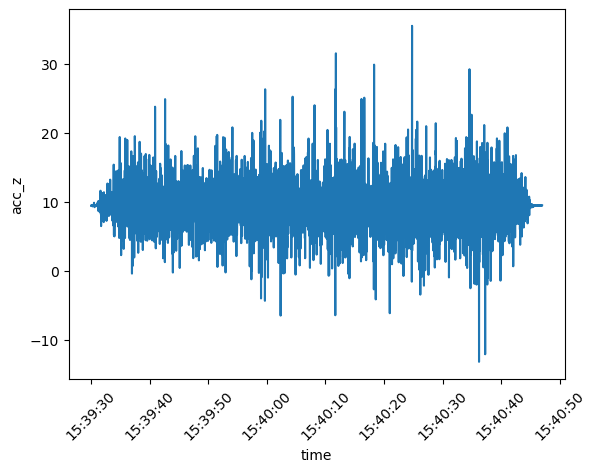

In [64]:
plot = sns.lineplot(data=baseline2segment, x='time', y='acc_z')
plot.set_xticklabels(plot.get_xticklabels(), rotation=45)

C:\Users\bodes\AppData\Local\Temp\ipykernel_2212\1330842222.py:2: UserWarning: FixedFormatter should only be used together with FixedLocator
  plot.set_xticklabels(plot.get_xticklabels(), rotation=45)


[Text(20373.654398148148, 0, '15:42:20'),
 Text(20373.65451388889, 0, '15:42:30'),
 Text(20373.65462962963, 0, '15:42:40'),
 Text(20373.65474537037, 0, '15:42:50'),
 Text(20373.65486111111, 0, '15:43:00')]

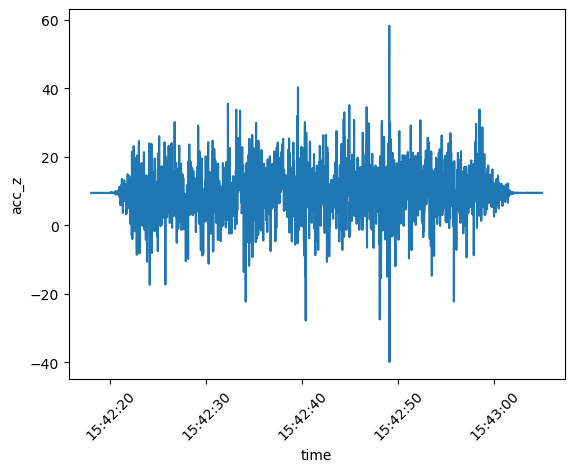

In [86]:
plot = sns.lineplot(data=bump1segment, x='time', y='acc_z')
plot.set_xticklabels(plot.get_xticklabels(), rotation=45)

C:\Users\bodes\AppData\Local\Temp\ipykernel_2212\29680837.py:2: UserWarning: FixedFormatter should only be used together with FixedLocator
  plot.set_xticklabels(plot.get_xticklabels(), rotation=45)


[Text(20373.655902777777, 0, '15:44:30'),
 Text(20373.65601851852, 0, '15:44:40'),
 Text(20373.656134259258, 0, '15:44:50'),
 Text(20373.65625, 0, '15:45:00'),
 Text(20373.656365740742, 0, '15:45:10'),
 Text(20373.65648148148, 0, '15:45:20'),
 Text(20373.656597222223, 0, '15:45:30')]

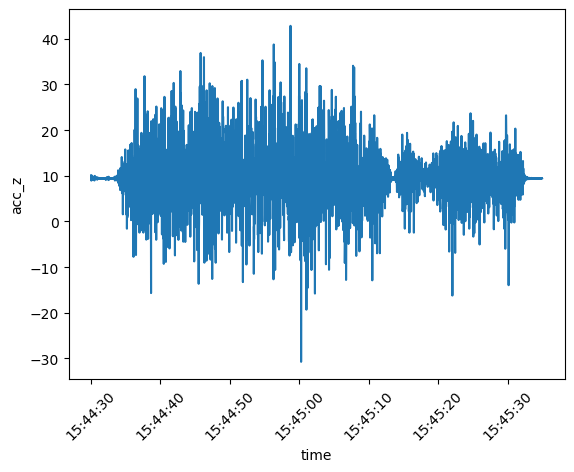

In [72]:
plot = sns.lineplot(data=doublebump1segment, x='time', y='acc_z')
plot.set_xticklabels(plot.get_xticklabels(), rotation=45)

C:\Users\bodes\AppData\Local\Temp\ipykernel_2212\2682706678.py:2: UserWarning: FixedFormatter should only be used together with FixedLocator
  plot.set_xticklabels(plot.get_xticklabels(), rotation=45)


[Text(20373.65740740741, 0, '15:46:40'),
 Text(20373.657465277778, 0, '15:46:45'),
 Text(20373.657523148147, 0, '15:46:50'),
 Text(20373.657581018517, 0, '15:46:55'),
 Text(20373.65763888889, 0, '15:47:00'),
 Text(20373.65769675926, 0, '15:47:05'),
 Text(20373.65775462963, 0, '15:47:10'),
 Text(20373.6578125, 0, '15:47:15'),
 Text(20373.65787037037, 0, '15:47:20'),
 Text(20373.65792824074, 0, '15:47:25')]

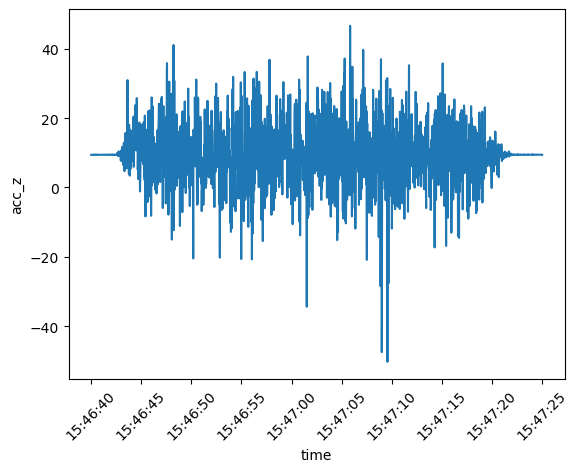

In [83]:
plot = sns.lineplot(data=smalllarge1segment, x='time', y='acc_z')
plot.set_xticklabels(plot.get_xticklabels(), rotation=45)

C:\Users\bodes\AppData\Local\Temp\ipykernel_2212\2392261057.py:2: UserWarning: FixedFormatter should only be used together with FixedLocator
  plot.set_xticklabels(plot.get_xticklabels(), rotation=45)


[Text(20373.658622685187, 0, '15:48:25'),
 Text(20373.658680555556, 0, '15:48:30'),
 Text(20373.658738425926, 0, '15:48:35'),
 Text(20373.658796296295, 0, '15:48:40'),
 Text(20373.658854166668, 0, '15:48:45'),
 Text(20373.658912037037, 0, '15:48:50'),
 Text(20373.658969907407, 0, '15:48:55'),
 Text(20373.65902777778, 0, '15:49:00'),
 Text(20373.65908564815, 0, '15:49:05'),
 Text(20373.65914351852, 0, '15:49:10')]

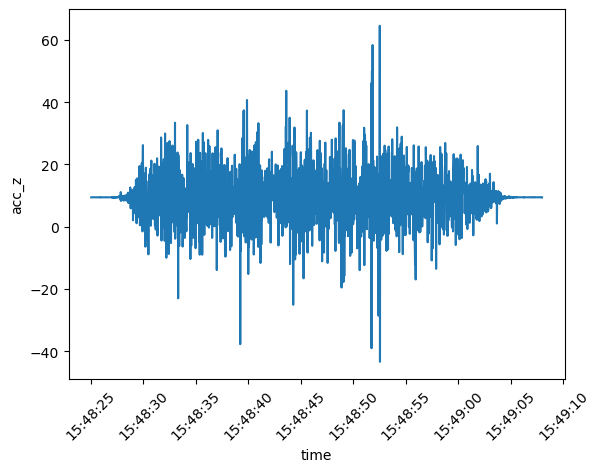

In [84]:
plot = sns.lineplot(data=smalllarge2segment, x='time', y='acc_z')
plot.set_xticklabels(plot.get_xticklabels(), rotation=45)

c:\Users\bodes\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


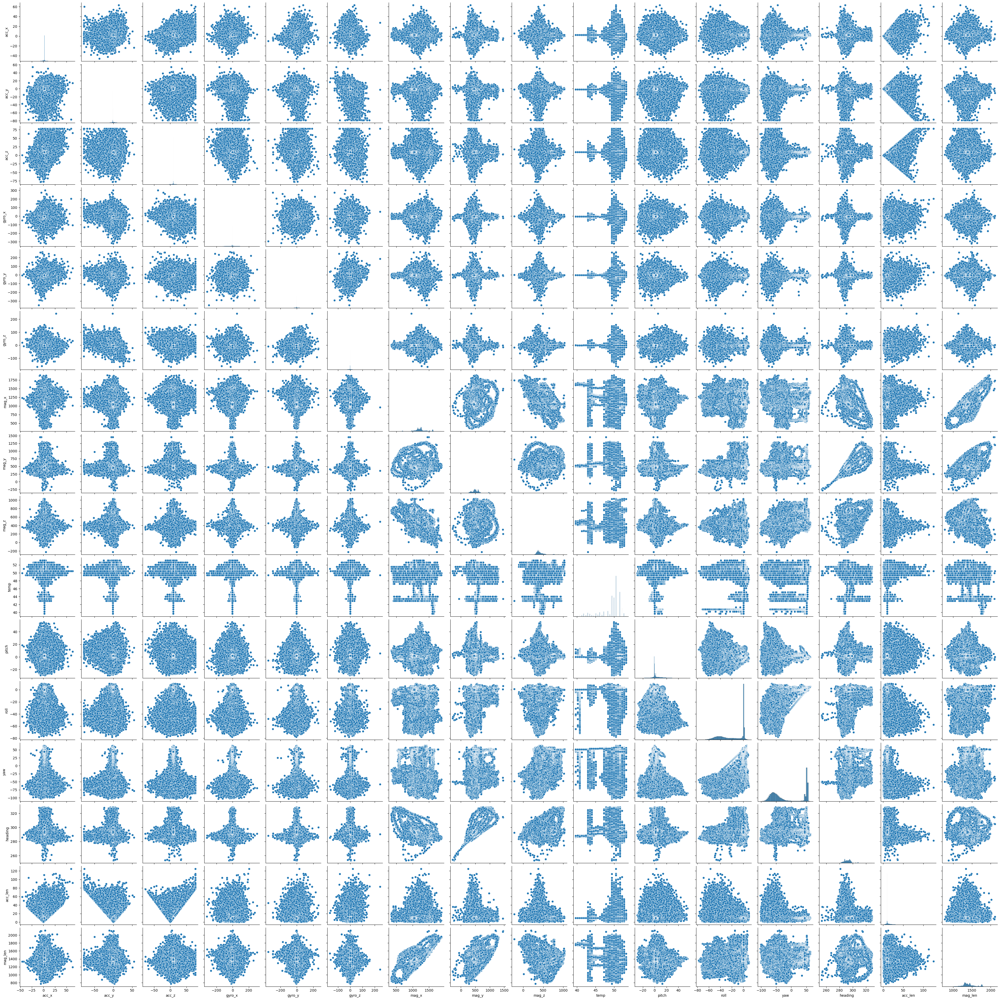

In [91]:
sns.pairplot(df[['acc_x', 'acc_y', 'acc_z', 'gyro_x', 'gyro_y', 'gyro_z', 'mag_x', 'mag_y', 'mag_z', 'temp',
       'pitch', 'pitch_st', 'roll', 'roll_st', 'yaw', 'yaw_st', 'heading',
       'acc_len', 'mag_len', 'mag_st']])